## Disease Condition prediction based on drug reviews

In this project, we will classify the condition of patients using the reviews of the drugs given by patients using drug reviews dataset available in [UCI ML Repository](https://archive.ics.uci.edu/ml/datasets/Drug+Review+Dataset+%28Drugs.com%29).

## Importing libraries

In [100]:
pip install pandas

In [101]:
pip install more-itertools

In [102]:

pip install -U scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [103]:
pip install strings 

  Using cached strings-0.1.2.tar.gz (2.2 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'error'
Note: you may need to restart the kernel to use updated packages.


  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> [20 lines of output]
      Traceback (most recent call last):
        File "c:\Users\LENOVO\AppData\Local\Programs\Python\Python312\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 353, in <module>
          main()
        File "c:\Users\LENOVO\AppData\Local\Programs\Python\Python312\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 335, in main
          json_out['return_val'] = hook(**hook_input['kwargs'])
                                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
        File "c:\Users\LENOVO\AppData\Local\Programs\Python\Python312\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 118, in get_requires_for_build_wheel
          return hook(config_settings)
                 ^^^^^^^^^^^^^^^^^^^^^
        File "C:\Users\LENOVO\AppData\Local\Temp\pip-build-env-z9tmy

In [104]:
pip install numpy

Note: you may need to restart the kernel to use updated packages.


In [105]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [106]:
import pandas as pd # data preprocessing
import itertools # confusion matrix
import string
import numpy as np
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
# To show all the rows of pandas dataframe
pd.set_option('display.max_rows', None)

In [107]:
%pip install BeautifulSoup4 

Note: you may need to restart the kernel to use updated packages.


In [108]:
str1="I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations."


lst = [str1]
lst

['I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations.']

In [109]:
pip install --user -U nltk

Note: you may need to restart the kernel to use updated packages.


In [110]:
pip install -U scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [111]:
pip install bs4

Note: you may need to restart the kernel to use updated packages.


In [112]:
import nltk
import sklearn
import bs4
print('The nltk version is {}.'.format(nltk.__version__))
print('The scikit-learn version is {}.'.format(sklearn.__version__))
print('The scikit-learn version is {}.'.format(bs4.__version__))

The nltk version is 3.8.1.
The scikit-learn version is 1.4.1.post1.
The scikit-learn version is 4.12.3.


In [113]:
df=pd.read_csv('drug/drugsComTrain_raw.tsv', sep='\t')

In [114]:
df.to_csv('drugsComTrain.csv',index=False)

In [115]:
df.head()

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil""",9.0,"May 20, 2012",27
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \r\nWe have tried many different medications and so far this is the most effective.""",8.0,"April 27, 2010",192
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.""",5.0,"December 14, 2009",17
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch""",8.0,"November 3, 2015",10
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around. I feel healthier, I&#039;m excelling at my job and I always have money in my pocket and my savings account. I had none of those before Suboxone and spent years abusing oxycontin. My paycheck was already spent by the time I got it and I started resorting to scheming and stealing to fund my addiction. All that is history. If you&#039;re ready to stop, there&#039;s a good chance that suboxone will put you on the path of great life again. I have found the side-effects to be minimal compared to oxycontin. I&#039;m actually sleeping better. Slight constipation is about it for me. It truly is amazing. The cost pales in comparison to what I spent on oxycontin.""",9.0,"November 27, 2016",37


In [116]:
df.condition.value_counts()

condition
Birth Control                                                          28788
Depression                                                              9069
Pain                                                                    6145
Anxiety                                                                 5904
Acne                                                                    5588
Bipolar Disorde                                                         4224
Insomnia                                                                3673
Weight Loss                                                             3609
Obesity                                                                 3568
ADHD                                                                    3383
Diabetes, Type 2                                                        2554
Emergency Contraception                                                 2463
High Blood Pressure                                               

In [117]:
df_train = df[(df['condition']=='Birth Control') | (df['condition']=='Depression') | (df['condition']=='High Blood Pressure')|(df['condition']=='Diabetes, Type 2')|(df['condition']=='Schizoaffective Disorde') |(df['condition']=='Obesity')|(df['condition']=='Pain')|(df['condition']=='Anxiety')|(df['condition']=='Acne')|(df['condition']=='Bipolar Disorde')|(df['condition']=='Insomnia')|(df['condition']=='Weight Loss')]

In [118]:
df.shape

(161297, 7)

In [119]:
df_train.shape

(75839, 7)

In [120]:
X = df_train.drop(['Unnamed: 0','drugName','rating','date','usefulCount'],axis=1)

## EDA

In [121]:
X.condition.value_counts()

condition
Birth Control              28788
Depression                  9069
Pain                        6145
Anxiety                     5904
Acne                        5588
Bipolar Disorde             4224
Insomnia                    3673
Weight Loss                 3609
Obesity                     3568
Diabetes, Type 2            2554
High Blood Pressure         2321
Schizoaffective Disorde      396
Name: count, dtype: int64

In [122]:
X.head()

,condition,review
2,Birth Control,"""I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."""
3,Birth Control,"""This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch"""
7,Bipolar Disorde,"""Abilify changed my life. There is hope. I was on Zoloft and Clonidine when I first started Abilify at the age of 15.. Zoloft for depression and Clondine to manage my complete rage. My moods were out of control. I was depressed and hopeless one second and then mean, irrational, and full of rage the next. My Dr. prescribed me 2mg of Abilify and from that point on I feel like I have been cured though I know I&#039;m not.. Bi-polar disorder is a constant battle. I know Abilify works for me because I have tried to get off it and lost complete control over my emotions. Went back on it and I was golden again. I am on 5mg 2x daily. I am now 21 and better than I have ever been in the past. Only side effect is I like to eat a lot."""
9,Birth Control,"""I had been on the pill for many years. When my doctor changed my RX to chateal, it was as effective. It really did help me by completely clearing my acne, this takes about 6 months though. I did not gain extra weight, or develop any emotional health issues. I stopped taking it bc I started using a more natural method of birth control, but started to take it bc I hate that my acne came back at age 28. I really hope symptoms like depression, or weight gain do not begin to affect me as I am older now. I&#039;m also naturally moody, so this may worsen things. I was in a negative mental rut today. Also I hope this doesn&#039;t push me over the edge, as I believe I am depressed. Hopefully it&#039;ll be just like when I was younger."""
11,Depression,"""I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."""


In [123]:
# segregating dataframe for analyzing individual condition
X_birth=X[(X['condition']=='Birth Control')]
X_dep=X[(X['condition']=='Depression')]
X_bp=X[(X['condition']=='High Blood Pressure')]
X_diab=X[(X['condition']=='Diabetes, Type 2')]
X_sd=X[(X['condition']=='Schizoaffective Disorde')]
X_ob=X[(X['condition']=='Obesity')]
X_pa=X[(X['condition']=='Pain')]
X_an=X[(X['condition']=='Anxiety')]
X_ac=X[(X['condition']=='Acne')]
X_bd=X[(X['condition']=='Bipolar Disorde')]
X_in=X[(X['condition']=='Insomnia')]
X_wl=X[(X['condition']=='Weight Loss')]


In [124]:
pip install wordcloud

In [125]:
from wordcloud import WordCloud

Text(0.5, 1.0, 'Word cloud for Schizoaffective Disorde')

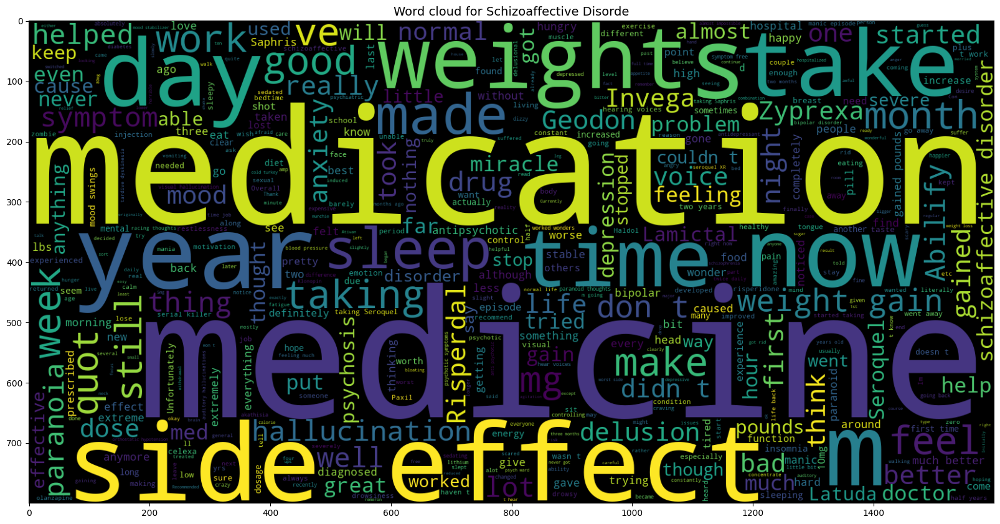

In [126]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_sd.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Schizoaffective Disorde',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Birth control')

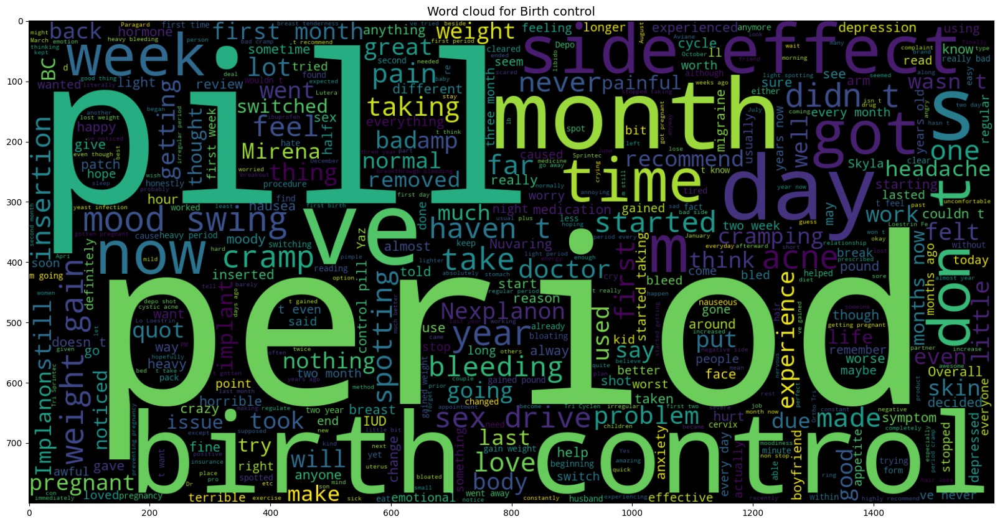

In [127]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_birth.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Birth control',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Depression')

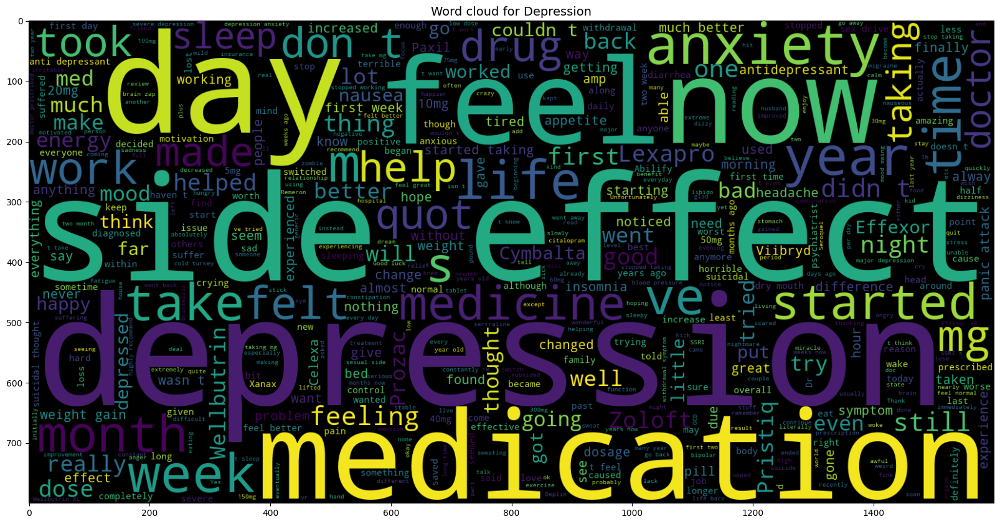

In [128]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_dep.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Depression',fontsize=14)

Text(0.5, 1.0, 'Word cloud for High Blood Pressure')

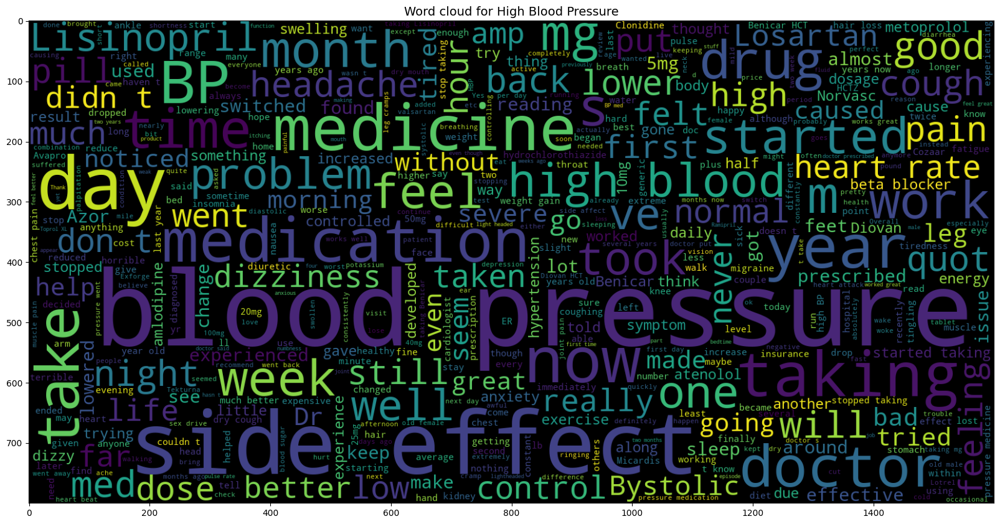

In [129]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_bp.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for High Blood Pressure',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Diabetes Type 2')

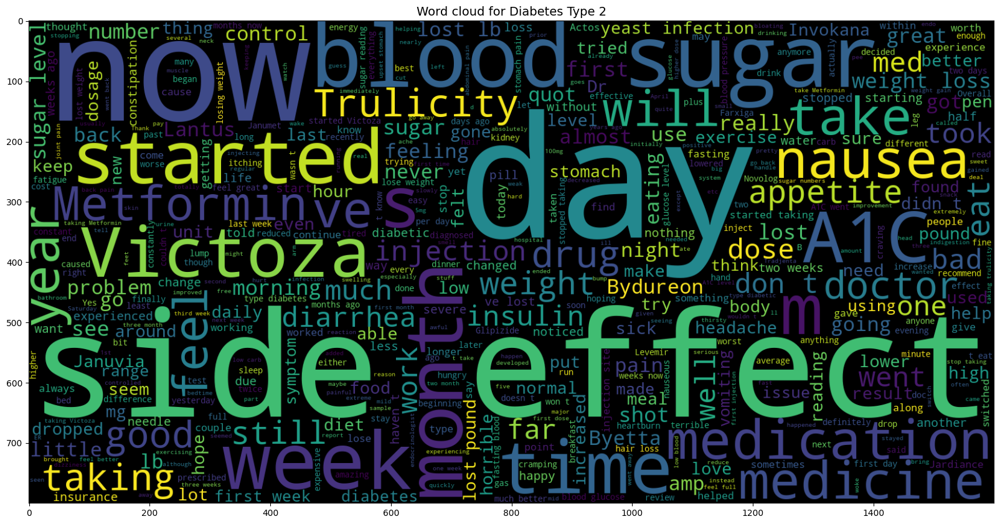

In [130]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_diab.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Diabetes Type 2',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Obesity')

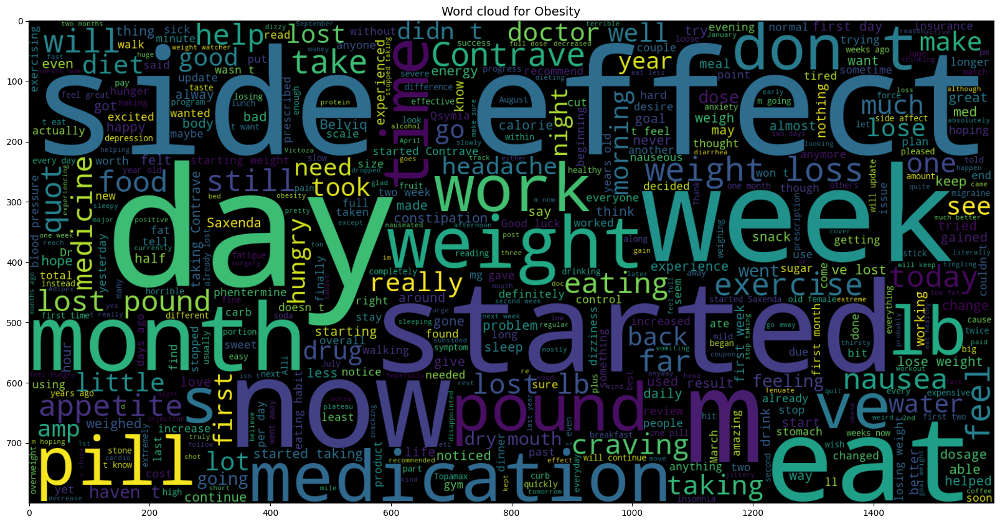

In [131]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_ob.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Obesity',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Pain')

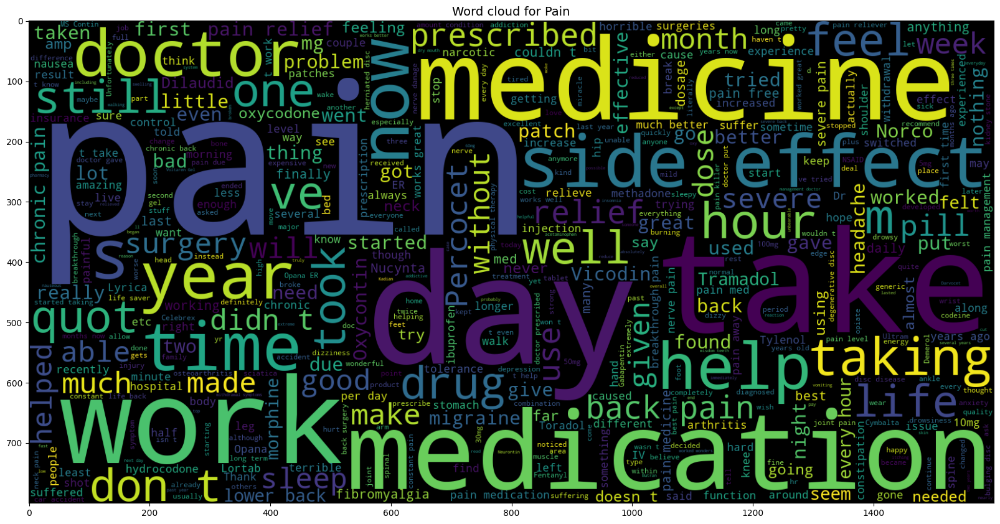

In [132]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_pa.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Pain',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Anxiety')

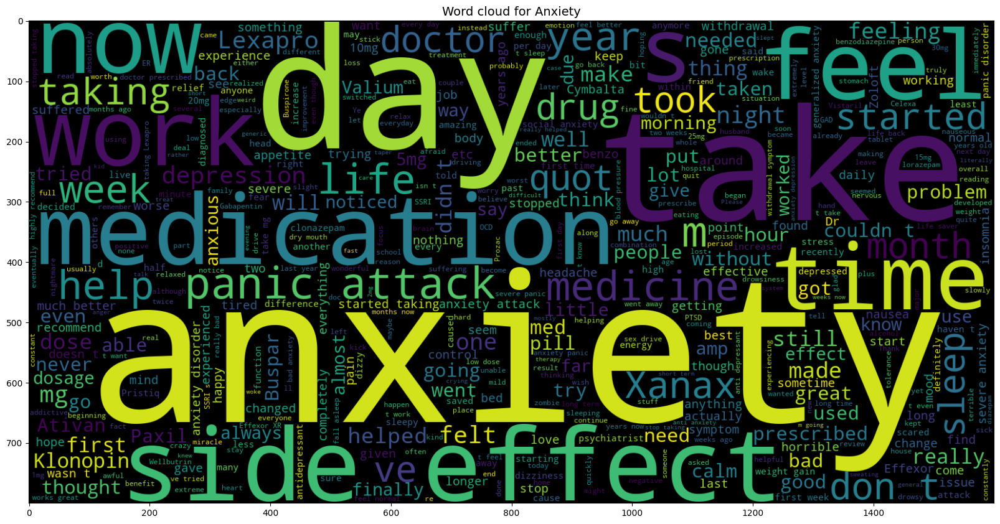

In [133]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_an.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Anxiety',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Acne')

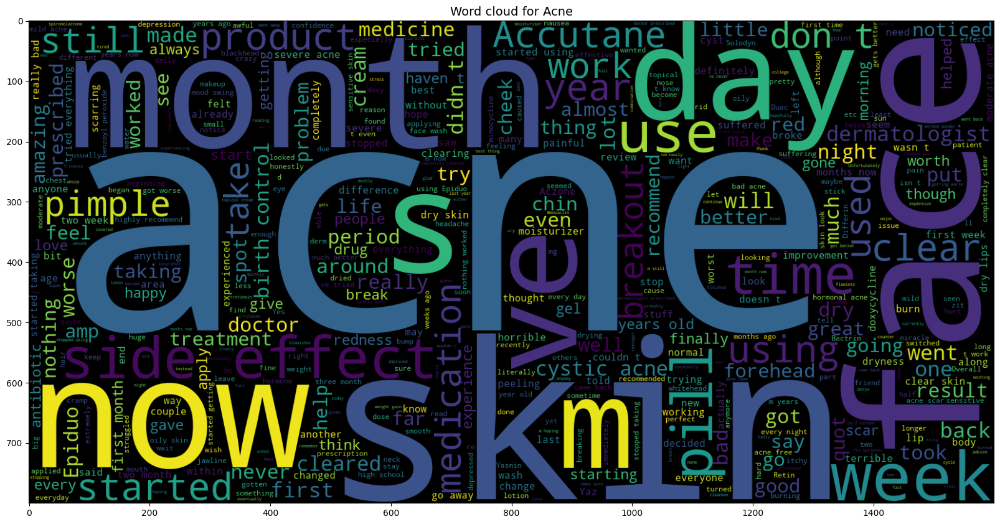

In [134]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_ac.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Acne',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Bipolar Disorde')

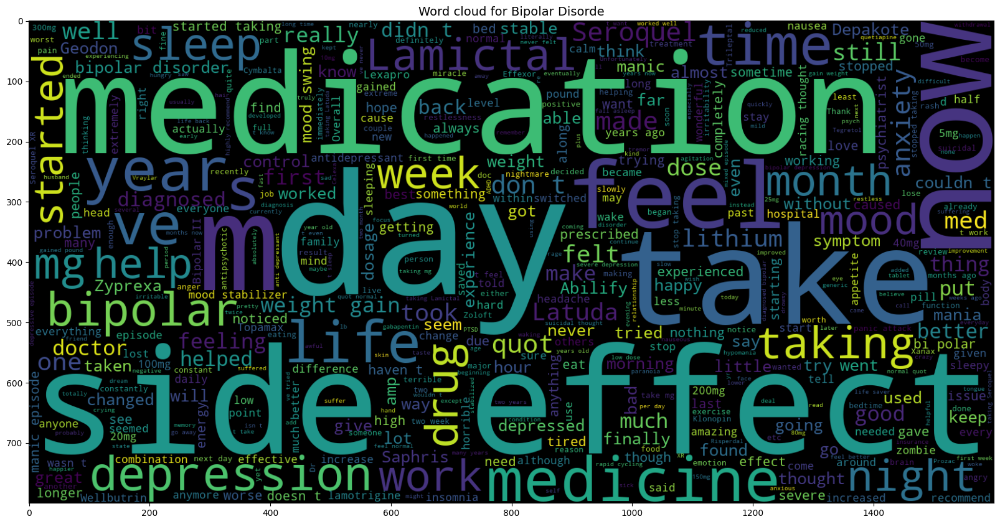

In [135]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_bd.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Bipolar Disorde',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Insomnia')

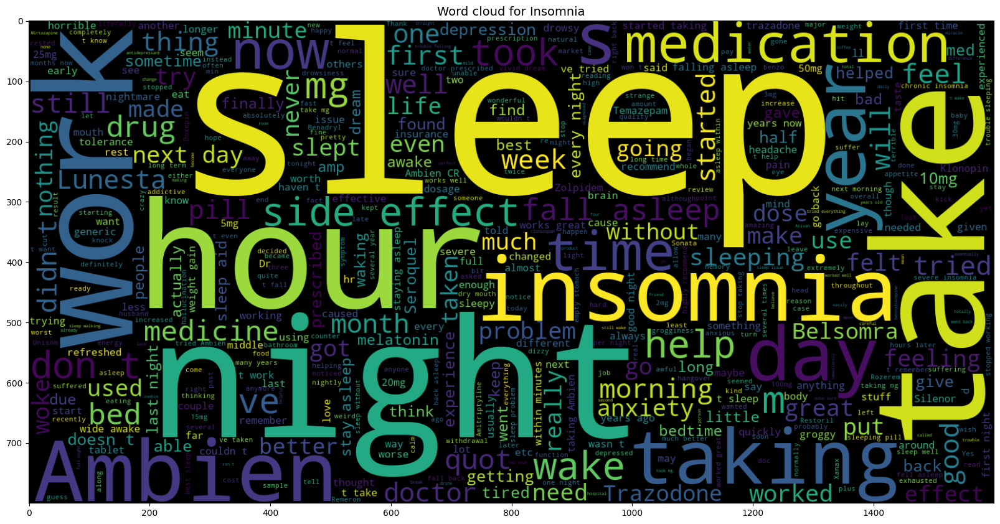

In [136]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_in.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Insomnia',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Weight Loss')

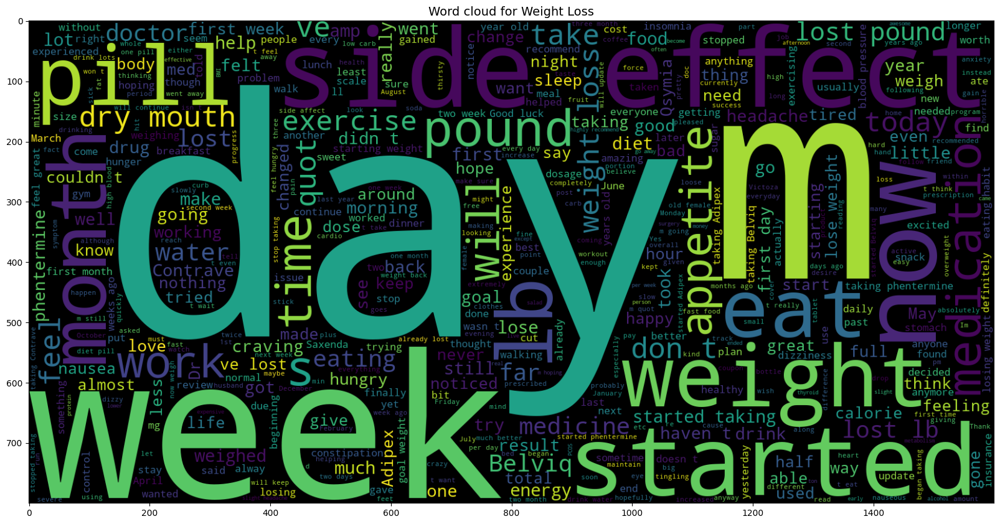

In [137]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_wl.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Weight Loss',fontsize=14)

## data preprocessing

In [138]:
X['review'][2]

'"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."'

In [139]:
X['review'][11]

'"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."'

In [140]:
for i, col in enumerate(X.columns):
    X.iloc[:, i] = X.iloc[:, i].str.replace('"', '')

In [141]:
# To set the width of the column to maximum
pd.set_option('max_colwidth', None)

In [142]:
X.head()

,condition,review
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch"
7,Bipolar Disorde,"Abilify changed my life. There is hope. I was on Zoloft and Clonidine when I first started Abilify at the age of 15.. Zoloft for depression and Clondine to manage my complete rage. My moods were out of control. I was depressed and hopeless one second and then mean, irrational, and full of rage the next. My Dr. prescribed me 2mg of Abilify and from that point on I feel like I have been cured though I know I&#039;m not.. Bi-polar disorder is a constant battle. I know Abilify works for me because I have tried to get off it and lost complete control over my emotions. Went back on it and I was golden again. I am on 5mg 2x daily. I am now 21 and better than I have ever been in the past. Only side effect is I like to eat a lot."
9,Birth Control,"I had been on the pill for many years. When my doctor changed my RX to chateal, it was as effective. It really did help me by completely clearing my acne, this takes about 6 months though. I did not gain extra weight, or develop any emotional health issues. I stopped taking it bc I started using a more natural method of birth control, but started to take it bc I hate that my acne came back at age 28. I really hope symptoms like depression, or weight gain do not begin to affect me as I am older now. I&#039;m also naturally moody, so this may worsen things. I was in a negative mental rut today. Also I hope this doesn&#039;t push me over the edge, as I believe I am depressed. Hopefully it&#039;ll be just like when I was younger."
11,Depression,"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."


### What are stopwords ?

Stopwords are the most common words in any natural language. For the purpose of building NLP models, these stopwords might not add much value to the meaning of the document.

The most common words used in a text are **“the”, “is”, “in”, “for”, “where”, “when”, “to”, “at”** etc.

In [143]:
import nltk

In [144]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [145]:
from nltk.corpus import stopwords

stop = stopwords.words('english')


In [146]:
stop

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

## Lemmitization
Lemmatization usually refers to doing things properly with the use of a vocabulary and morphological analysis of words, normally aiming to remove inflectional endings only and to return the base or dictionary form of a word, which is known as the lemma .

In [2]:
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer

porter = PorterStemmer()

lemmatizer = WordNetLemmatizer()

In [3]:
print(porter.stem("sportingly"))
print(porter.stem("very"))
print(porter.stem("troubled"))
print(porter.stem("beautiful"))
print(porter.stem("beautifully"))
print(porter.stem("beautifulness"))

sportingli
veri
troubl
beauti
beauti
beauti


In [149]:
import nltk

In [150]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [151]:
print(lemmatizer.lemmatize("sportingly"))
print(lemmatizer.lemmatize("very"))
print(lemmatizer.lemmatize("troubled"))

sportingly
very
troubled


In [152]:
from bs4 import BeautifulSoup
import re

In [153]:
def review_to_words(raw_review):
    # 1. Delete HTML 
    review_text = BeautifulSoup(raw_review, 'html.parser').get_text()
    # 2. Make a space
    letters_only = re.sub('[^a-zA-Z]', ' ', review_text)
    # 3. lower letters
    words = letters_only.lower().split()
    # 5. Stopwords 
    meaningful_words = [w for w in words if not w in stop]
    # 6. lemmitization
    lemmitize_words = [lemmatizer.lemmatize(w) for w in meaningful_words]
    # 7. space join words
    return( ' '.join(lemmitize_words))

In [154]:
X['review_clean'] = X['review'].apply(review_to_words)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_16632\2066199760.py:3: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  review_text = BeautifulSoup(raw_review, 'html.parser').get_text()


In [155]:
X.head()

,condition,review,review_clean
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.",used take another oral contraceptive pill cycle happy light period max day side effect contained hormone gestodene available u switched lybrel ingredient similar pill ended started lybrel immediately first day period instruction said period lasted two week taking second pack two week third pack thing got even worse third period lasted two week end third week still daily brown discharge positive side side effect idea period free tempting ala
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch",first time using form birth control glad went patch month first decreased libido subsided downside made period longer day exact used period day max also made cramp intense first two day period never cramp using birth control happy patch
7,Bipolar Disorde,"Abilify changed my life. There is hope. I was on Zoloft and Clonidine when I first started Abilify at the age of 15.. Zoloft for depression and Clondine to manage my complete rage. My moods were out of control. I was depressed and hopeless one second and then mean, irrational, and full of rage the next. My Dr. prescribed me 2mg of Abilify and from that point on I feel like I have been cured though I know I&#039;m not.. Bi-polar disorder is a constant battle. I know Abilify works for me because I have tried to get off it and lost complete control over my emotions. Went back on it and I was golden again. I am on 5mg 2x daily. I am now 21 and better than I have ever been in the past. Only side effect is I like to eat a lot.",abilify changed life hope zoloft clonidine first started abilify age zoloft depression clondine manage complete rage mood control depressed hopeless one second mean irrational full rage next dr prescribed mg abilify point feel like cured though know bi polar disorder constant battle know abilify work tried get lost complete control emotion went back golden mg x daily better ever past side effect like eat lot
9,Birth Control,"I had been on the pill for many years. When my doctor changed my RX to chateal, it was as effective. It really did help me by completely clearing my acne, this takes about 6 months though. I did not gain extra weight, or develop any emotional health issues. I stopped taking it bc I started using a more natural method of birth control, but started to take it bc I hate that my acne came back at age 28. I really hope symptoms like depression, or weight gain do not begin to affect me as I am older now. I&#039;m also naturally moody, so this may worsen things. I was in a negative mental rut today. Also I hope this doesn&#039;t push me over the edge, as I believe I am depressed. Hopefully it&#039;ll be just like when I was younger.",pill many year doctor changed rx chateal effective really help completely clearing acne take month though gain extra weight develop

## Creating features and Target Variable

In [156]:
X_feat=X['review_clean']
y=X['condition']

In [157]:
X_train, X_test, y_train, y_test = train_test_split(X_feat, y,stratify=y,test_size=0.2, random_state=0)

In [158]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    See full source and example: 
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

### Bag of Words

In [159]:
count_vectorizer = CountVectorizer(stop_words='english')

count_train = count_vectorizer.fit_transform(X_train)

count_test = count_vectorizer.transform(X_test)

In [160]:
count_train

<60671x23249 sparse matrix of type '<class 'numpy.int64'>'
	with 1866788 stored elements in Compressed Sparse Row format>

## Machine Learning Model : Naive Bayes

accuracy:   0.855
Confusion matrix, without normalization


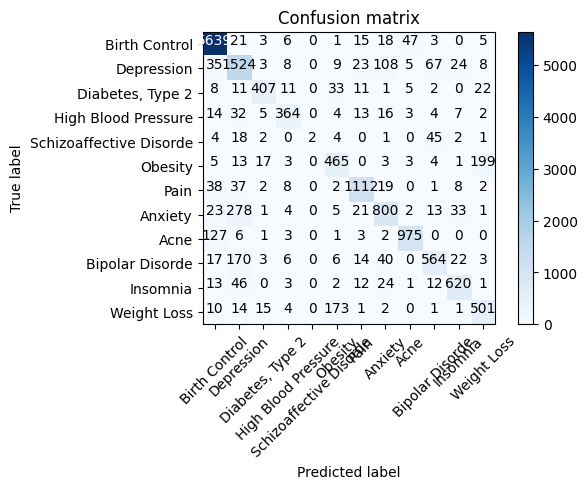

In [161]:
mnb = MultinomialNB()
mnb.fit(count_train, y_train)
pred = mnb.predict(count_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)

cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression','Diabetes, Type 2','High Blood Pressure','Schizoaffective Disorde','Obesity','Pain','Anxiety','Acne','Bipolar Disorde','Insomnia','Weight Loss'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression','Diabetes, Type 2','High Blood Pressure','Schizoaffective Disorde','Obesity','Pain','Anxiety','Acne','Bipolar Disorde','Insomnia','Weight Loss'])

## Machine Learning Model : Passive Aggressive Classifier

accuracy:   0.876
Confusion matrix, without normalization


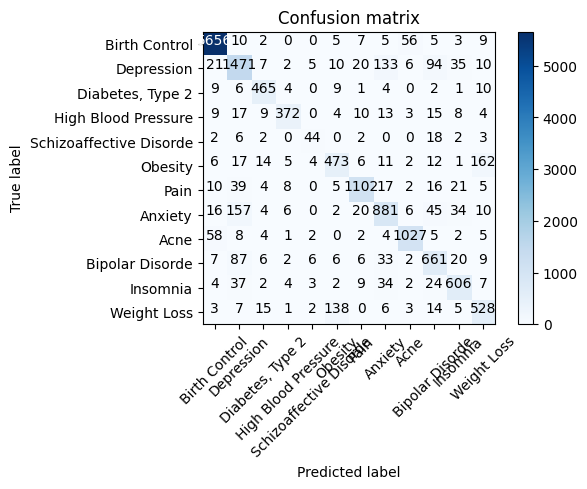

In [162]:
from sklearn.linear_model import PassiveAggressiveClassifier,LogisticRegression

passive = PassiveAggressiveClassifier()
passive.fit(count_train, y_train)
pred = passive.predict(count_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression','Diabetes, Type 2','High Blood Pressure','Schizoaffective Disorde','Obesity','Pain','Anxiety','Acne','Bipolar Disorde','Insomnia','Weight Loss'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression','Diabetes, Type 2','High Blood Pressure','Schizoaffective Disorde','Obesity','Pain','Anxiety','Acne','Bipolar Disorde','Insomnia','Weight Loss'])

### TFIDF

In [163]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_df=0.8)
tfidf_train_2 = tfidf_vectorizer.fit_transform(X_train)
tfidf_test_2 = tfidf_vectorizer.transform(X_test)

## Machine Learning Model : Naive Bayes

accuracy:   0.730
Confusion matrix, without normalization


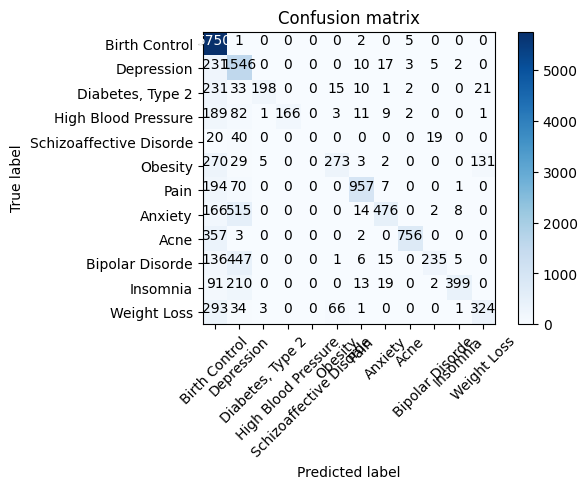

In [164]:
mnb_tf = MultinomialNB()
mnb_tf.fit(tfidf_train_2, y_train)
pred = mnb_tf.predict(tfidf_test_2)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression','Diabetes, Type 2','High Blood Pressure','Schizoaffective Disorde','Obesity','Pain','Anxiety','Acne','Bipolar Disorde','Insomnia','Weight Loss'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression','Diabetes, Type 2','High Blood Pressure','Schizoaffective Disorde','Obesity','Pain','Anxiety','Acne','Bipolar Disorde','Insomnia','Weight Loss'])

## Machine Learning Model TFIDF

accuracy:   0.891
Confusion matrix, without normalization


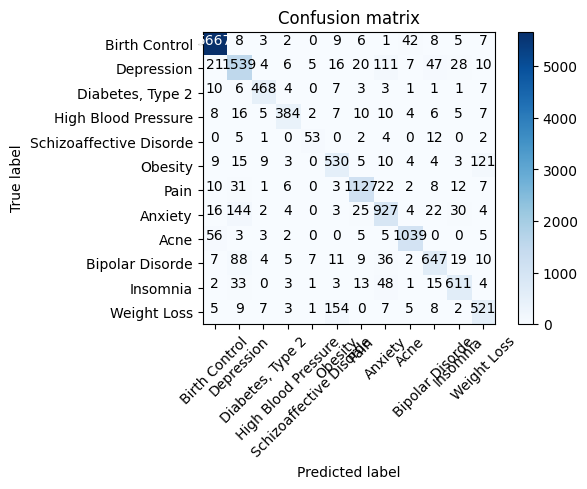

In [165]:
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_df=0.8)
tfidf_train = tfidf_vectorizer.fit_transform(X_train)
tfidf_test = tfidf_vectorizer.transform(X_test)

pass_tf = PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train, y_train)
pred = pass_tf.predict(tfidf_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression','Diabetes, Type 2','High Blood Pressure','Schizoaffective Disorde','Obesity','Pain','Anxiety','Acne','Bipolar Disorde','Insomnia','Weight Loss'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression','Diabetes, Type 2','High Blood Pressure','Schizoaffective Disorde','Obesity','Pain','Anxiety','Acne','Bipolar Disorde','Insomnia','Weight Loss'])

## TFIDF: Bigrams

In [166]:
tfidf_vectorizer2 = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,2))
tfidf_train_2 = tfidf_vectorizer2.fit_transform(X_train)
tfidf_test_2 = tfidf_vectorizer2.transform(X_test)

accuracy:   0.920
Confusion matrix, without normalization


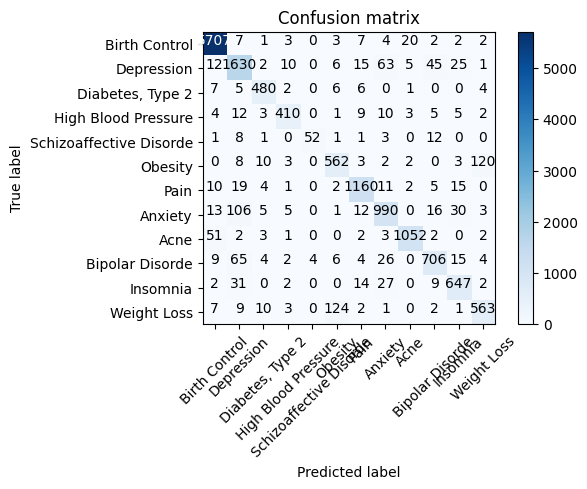

In [167]:
pass_tf = PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train_2, y_train)
pred = pass_tf.predict(tfidf_test_2)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression','Diabetes, Type 2','High Blood Pressure','Schizoaffective Disorde','Obesity','Pain','Anxiety','Acne','Bipolar Disorde','Insomnia','Weight Loss'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression','Diabetes, Type 2','High Blood Pressure','Schizoaffective Disorde','Obesity','Pain','Anxiety','Acne','Bipolar Disorde','Insomnia','Weight Loss'])

## TFIDF : Trigrams

accuracy:   0.922
Confusion matrix, without normalization


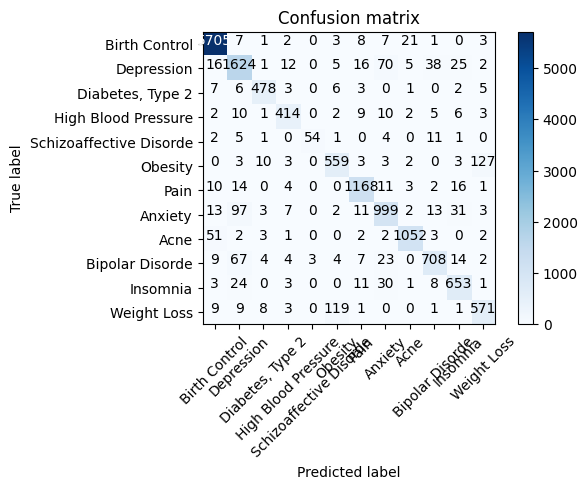

In [168]:
tfidf_vectorizer3 = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,3))
tfidf_train_3 = tfidf_vectorizer3.fit_transform(X_train)
tfidf_test_3 = tfidf_vectorizer3.transform(X_test)

pass_tf = PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train_3, y_train)
pred = pass_tf.predict(tfidf_test_3)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression','Diabetes, Type 2','High Blood Pressure','Schizoaffective Disorde','Obesity','Pain','Anxiety','Acne','Bipolar Disorde','Insomnia','Weight Loss'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression','Diabetes, Type 2','High Blood Pressure','Schizoaffective Disorde','Obesity','Pain','Anxiety','Acne','Bipolar Disorde','Insomnia','Weight Loss'])

## Most important Features

In [169]:
def most_informative_feature_for_class(vectorizer, classifier, classlabel, n=100):
    if classlabel not in classifier.classes_:
        # Add the class label to the list of classes
        classifier.classes_ = np.append(classifier.classes_, classlabel)
        # Initialize coefficients for the new class
        classifier.coef_ = np.vstack([classifier.coef_, np.zeros_like(classifier.coef_[0])])
        
    labelid = np.where(classifier.classes_ == classlabel)[0]
    
    if len(labelid) == 0:
        print(f"Error: '{classlabel}' is not in the list of classes.")
        return
    
    labelid = labelid[0]
    
    feature_names = vectorizer.get_feature_names_out()
    
    if labelid >= classifier.coef_.shape[0]:
        print(f"Error: Index {labelid} is out of bounds for axis 0 with size {classifier.coef_.shape[0]}.")
        return
    
    topn = sorted(zip(classifier.coef_[labelid], feature_names))[-n:]

    print(f"Top {n} Most Informative Features for Class: {classlabel}")
    for coef, feat in topn:
        print(feat, coef)

# Assuming tfidf_vectorizer2 and pass_tf are defined elsewhere
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Schizoaffective Disorde')




# Assuming tfidf_vectorizer2 and pass_tf are defined elsewhere
#most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Birth Control')


Top 100 Most Informative Features for Class: Schizoaffective Disorde
say particular 0.48326992014914877
time pack 0.48326992014914877
woken twice 0.48326992014914877
effect gave 0.4839466733413641
smaller group 0.48439746435258113
ob easy 0.48757159375720227
really best 0.48757159375720227
like common 0.49061441465432704
severity stopped 0.4966238329215768
able clean 0.5038475256914484
rheumatologist celebrex 0.5089453367742774
sneezing flu 0.5102585337322273
say partner 0.5130189725895135
able self 0.5135333359831663
able sell 0.5135333359831663
privifem spritec 0.5135333359831663
sight dr 0.5135333359831663
experiencing acne 0.5140493098420355
quil 0.5140493098420355
quilonum 0.5140493098420355
priority check 0.5182558873220424
got mono 0.5204224200628788
able clear 0.5212094726094901
appear overnight 0.5212094726094901
brand performed 0.5212094726094901
brand personal 0.5212094726094901
great split 0.5212094726094901
symptom hit 0.5343626906463003
got month 0.5345107799224635
old st

In [170]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Schizoaffective Disorde')

Top 100 Most Informative Features for Class: Schizoaffective Disorde
say particular 0.48326992014914877
time pack 0.48326992014914877
woken twice 0.48326992014914877
effect gave 0.4839466733413641
smaller group 0.48439746435258113
ob easy 0.48757159375720227
really best 0.48757159375720227
like common 0.49061441465432704
severity stopped 0.4966238329215768
able clean 0.5038475256914484
rheumatologist celebrex 0.5089453367742774
sneezing flu 0.5102585337322273
say partner 0.5130189725895135
able self 0.5135333359831663
able sell 0.5135333359831663
privifem spritec 0.5135333359831663
sight dr 0.5135333359831663
experiencing acne 0.5140493098420355
quil 0.5140493098420355
quilonum 0.5140493098420355
priority check 0.5182558873220424
got mono 0.5204224200628788
able clear 0.5212094726094901
appear overnight 0.5212094726094901
brand performed 0.5212094726094901
brand personal 0.5212094726094901
great split 0.5212094726094901
symptom hit 0.5343626906463003
got month 0.5345107799224635
old st

In [171]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Birth Control')

Top 100 Most Informative Features for Class: Birth Control
ensure irritated 0.9571450117191422
depot year 0.9595570613472292
february cm 0.963142386088019
amazing shortness 0.9638471931524548
affect zarah 0.9675988372281777
struggling finding 0.9764224006888332
got real 0.9806171157197416
time cortisone 0.9824956843914509
unfortunately near 0.984746217633713
amazing slept 0.9894910190306491
function tear 1.0010449418995437
filter relax 1.0360199304801423
people abilify 1.056650921239054
stand birth 1.057516960965322
abilify insurance 1.0593871182233934
peel visit 1.0863778924130116
abdomen primary 1.0874085343855127
prescribed beyaz 1.10139677644199
kind euphoria 1.105296981775791
kind euphoric 1.105296981775791
switch impatient 1.1174913692101287
understood bad 1.128940548237256
med grateful 1.1394906704152803
oriented got 1.1538805840145385
drinking way 1.171340589287623
im absolutely 1.18282279462251
usual birth 1.1851635868697132
say trinessa 1.1890786467772954
meat med 1.190523042

In [172]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Obesity')

Top 100 Most Informative Features for Class: Obesity
experience realize 0.7767544923208538
sun came 0.7779149577441906
ocella crave 0.7790976707850022
artery lot 0.7841909373629432
problem polycystic 0.7852324145739425
sleepless 0.7862864737736408
task morning 0.7921315036626099
weight explained 0.7934782404844114
wake slept 0.7967455270398345
rx took 0.7972170528714897
appetite write 0.7986710861948048
neasea vomitting 0.7988545246984787
medicine research 0.7999809908169265
looked went 0.8006954135164541
cycling non 0.8040969851923933
setting fence 0.8068487795943112
gettting 0.8070329899156137
skin tho 0.8087875426056742
lb maintained 0.8090891601139489
fruit low 0.8116090674914253
like common 0.8116625610461645
sexual dream 0.8148622239235995
really subtle 0.8168363739458483
significantly longer 0.8213806208113339
nearly week 0.8269835731809834
life given 0.8279209592000748
dosed ambien 0.8315792961624839
medic medication 0.8337343950619732
turkey really 0.836681230284305
lb stone 0

In [173]:

most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Depression')

Top 100 Most Informative Features for Class: Depression
brintellix anxious 1.081471188196396
weaned medication 1.0856594215896682
stressing taken 1.0911961426312284
pcos little 1.0940781981306695
bit nerve 1.0949311564682842
skin sad 1.0958983113452825
fine recommend 1.101671818455732
breakdown cost 1.1053040297967713
source depression 1.10939527916678
major like 1.1166700357197363
minute given 1.1179813200836253
said trulicity 1.125276941266937
said try 1.125276941266937
fine nd 1.1395336287312514
greatly overall 1.1396722265816615
spotting late 1.1417619768940017
depression saying 1.1418608769904526
boast discount 1.1500845852682053
disease immediate 1.1501089769194937
routine totally 1.15057986782847
wreck needed 1.1518303819319216
truly negative 1.1522417634558246
benzaclin saw 1.1553177717852372
dose benzo 1.1566960573030387
cymbalta saw 1.1603778741115738
groan little 1.168740117598245
sex welcome 1.1762167995927588
bite guard 1.177579178078559
lo fav 1.1801407128304795
bufferin 

In [174]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'High Blood Pressure')

Top 100 Most Informative Features for Class: High Blood Pressure
flaking mean 0.7887968943239417
truly mind 0.7945495460151645
attribute supression 0.7960359635275082
shrink quickly 0.7960359635275082
shrink reproductive 0.7960359635275082
ssri failed 0.7967234971209275
history alcohol 0.8055426186648175
teeth waiting 0.8069723858825905
got september 0.8071895219648959
workout trainer 0.8071895219648959
say minute 0.8095726774475706
tired zip 0.8095726774475706
anxious took 0.8182753137356175
thoracic pain 0.8201682598448521
try fought 0.8236043130193059
time use 0.8347901825227504
given ovarian 0.837562071046877
qsymia help 0.8401317227643833
slowing hoping 0.8441341078867779
trying eliminate 0.8463877558614148
thanks drug 0.8494560305914438
moderate age 0.8506742308949724
gain manage 0.8561588433928787
till read 0.8574522625457319
post write 0.8715080616632037
rough actual 0.8783039142741287
time achy 0.8814254335314976
oxycontin evening 0.8874574254708741
tkr 0.8929505067372714
woma

In [175]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Diabetes, Type 2')

Top 100 Most Informative Features for Class: Diabetes, Type 2
based option 0.6814498973272601
contraction given 0.6833837074745011
sprintec caused 0.6871054548576545
abilify shown 0.689778136092877
disappears month 0.69248047688044
got pretty 0.6928584245944337
got prevent 0.6928584245944337
night tonight 0.6942515365588533
prescribed beyaz 0.6950301449041356
damage diabetes 0.6968531811639991
sample doctor 0.7007520992953483
morning nerve 0.7013228997884916
matter moisturiser 0.7099077952704691
matter moisturizer 0.7099077952704691
lifestyle removed 0.7107707574443944
abilify insurance 0.7132072534916015
financially best 0.7142099739982968
phetermine plan 0.71559312865453
phetermine time 0.71559312865453
flash saying 0.7186575337506577
screened 0.7249439616386457
sex possibly 0.7262263005731074
doctor lost 0.7283392242646617
severe stretch 0.7305147800493318
nausea wouldve 0.7352251837465356
flash sex 0.7427093288999784
got tart 0.7429195633446097
got taste 0.7429195633446097
acceptab

In [176]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Pain')

Top 100 Most Informative Features for Class: Pain
pulled took 0.9219866890181164
runny 0.9311039582611633
stair unable 0.9330668268650221
face apply 0.9357124750674871
beer weight 0.9395963230849516
weight breastfeeding 0.9435146884634588
knocked literally 0.9652174675396938
gotten common 0.9672267310943441
redness scaly 0.9789642814600711
attention sign 0.9819973195529653
posed 0.9837416944999731
size pimple 0.9837416944999731
sarcoidiosis given 0.9937374859715358
roof unemployed 1.0026575979079444
trial victoza 1.0080520740524106
trying drop 1.0084620633143475
fine unclear 1.0107900097163294
med def 1.0134148648266816
fatigue weakness 1.018072723540346
mood ive 1.0225752337757006
time longest 1.043267256794714
angry ashamed 1.0488478242583121
halfway 1.0645403511072897
doctor easy 1.064771281850182
coped life 1.0660244305908841
uterus actually 1.0683911162583266
apply corner 1.0798207390664907
way xulane 1.081910045523173
diffrent 1.0993704515854728
spotting nausea 1.1012194711772803

In [177]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Anxiety')

Top 100 Most Informative Features for Class: Anxiety
sever breast 0.9564697353797333
spill nervous 0.959664067700393
productive specified 0.9596662847164866
safe got 0.9609589980377735
hovers ish 0.9611594927117514
type med 0.9612802295690095
quickly dealing 0.9612926132116548
sympto 0.9622077460427106
proclaimed hypochondriac 0.9639040684454292
rocking motion 0.9675645306267117
actually mean 0.9750230374845009
negative reading 0.9773280958246183
burn helped 0.9791112468531168
rinse dry 0.9807309821185609
odd fruity 0.9901495824737657
numbs arm 0.9902566062335345
happy stuff 0.9916795991913511
gain 0.9976296157909992
happy started 1.0004596087448665
worth trade 1.0031738324766262
disease immediate 1.0152992210616714
forte nighttime 1.0157286382027146
slow hungry 1.0167083013560463
fuzzy overall 1.0197256018589314
ocd hopelessness 1.0197256018589314
brittle acne 1.0254420723193987
best edge 1.0475050391810456
metformin combination 1.0509799146973777
january personally 1.0546416063193784

In [178]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Acne')

Top 100 Most Informative Features for Class: Acne
paxil feeling 0.7070606116722229
alcohol occasional 0.7073285892093228
sciatica herniated 0.7085490962457061
sciatica increase 0.7085490962457061
trying lunesta 0.7085490962457061
day street 0.7263641863117342
working garden 0.7530676010309548
forehead imagine 0.7609887035395895
follow mid 0.7643459653008948
tolerance fast 0.7656168263726373
havent exercise 0.7668367617316684
dizziness dehydrated 0.7776308273998497
practice providing 0.7824500856871681
dread mg 0.790093326195313
patience worth 0.7948926482112384
assuming mean 0.811292855428701
super energized 0.813740240177826
medical plan 0.8174836786295945
suggested prescribedby 0.8211317506999075
citalopram working 0.8434323422849489
yr long 0.8446842767335172
working crazy 0.8460920090863936
finish took 0.8462841067969012
complication period 0.8482573176584005
quickly getting 0.850872222719282
adipex july 0.8518043280181281
ativan best 0.8683546516840411
bloat 0.8870232863684624
wor

In [179]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Bipolar Disorde')

Top 100 Most Informative Features for Class: Bipolar Disorde
usually crave 0.8439497740267862
suck watch 0.8487174336565199
rinse dry 0.8541037899796806
time aweek 0.8551990062893173
avoiding year 0.8565593982459023
tieing 0.8573107886906413
gain method 0.8589113830992581
pimple teenage 0.8589113830992581
pimple th 0.8589113830992581
stomach looked 0.8628471607882353
gabapentin prescribed 0.870371151137075
panic anxiety 0.8732646024808516
instinct thinking 0.8787265629757256
month bump 0.8808998790772931
period fixed 0.895181423170596
medication restoril 0.8994050375069664
obsessing thing 0.9039570733870135
deal decreased 0.9089849563434963
need regularly 0.9123018920612638
skyla boyfriend 0.9219522588528429
tid combined 0.9225682754277515
implant impossible 0.926041943676334
rub hand 0.9287546934049344
spot rd 0.9408837968272595
open case 0.9449231204861138
boyfriend intimate 0.9474992106094873
drink litre 0.9541062234725645
intense suicidal 0.9586185539532142
stomach looking 0.965704

In [180]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Insomnia')

Top 100 Most Informative Features for Class: Insomnia
buttercup look 0.7877226332509053
detox phentermine 0.7878896495968508
functioning hoped 0.7945478645900111
treating social 0.7991986314226684
weaker abdomen 0.8026272709728056
come deceiving 0.8087903103089478
moody stopping 0.8092843352411874
tretinoin angry 0.8103137495483654
weaker dull 0.8133647763527496
momentum going 0.8138802121408582
cymbalta depression 0.8146929655040817
determinately 0.817182130820098
nessa order 0.8183303212053402
desperate went 0.8198913217425494
multiple intense 0.8240561276471268
appointment asked 0.8250853090373105
point sure 0.8262569611004547
effect gave 0.8297328501962078
drier soon 0.8338895182247752
tired anxious 0.8338895182247752
turned saved 0.8402274367378568
vomiting eating 0.8420866068439563
glucose jumped 0.8440863291752765
nexplanon yo 0.8442502484519179
child oh 0.8542331158193865
child old 0.8542331158193865
gain menopause 0.8542331158193865
treatment dry 0.8715572657723324
vomiting eg

In [181]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Weight Loss')

Top 100 Most Informative Features for Class: Weight Loss
fiance broke 0.7523012556239655
mother month 0.7547361187656892
im relaxed 0.7559267756495287
better bipolar 0.7685183367638406
lb mainly 0.7734308625496661
nice recently 0.7742748169936672
lb suck 0.7808989057533327
saxenda craving 0.7831337747996149
med tho 0.783886455644996
state longer 0.7863232445522845
trust psych 0.7885881194854848
xanax sparingly 0.7906878689691055
heavy exerciser 0.7938806065744091
norco gabapentin 0.798839946911043
timeframe fetzima 0.8039628151759348
syndrome child 0.8053159169259003
year orsythia 0.8148246258659266
cost hope 0.81486558745912
device highly 0.8177424295798759
drinker wine 0.8220228005180591
mouth sleeping 0.8284209954700927
discomfort medication 0.8287465479514743
year extremely 0.8287571607507287
bed refusing 0.8290067958094582
skin stayed 0.8306082832270517
tune cycle 0.8306082832270517
tune lisinopril 0.8306082832270517
treated urinary 0.8315082912127572
lantus slidin 0.8340193940463

In [182]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Schizoaffective Disorde')

Top 100 Most Informative Features for Class: Schizoaffective Disorde
say particular 0.48326992014914877
time pack 0.48326992014914877
woken twice 0.48326992014914877
effect gave 0.4839466733413641
smaller group 0.48439746435258113
ob easy 0.48757159375720227
really best 0.48757159375720227
like common 0.49061441465432704
severity stopped 0.4966238329215768
able clean 0.5038475256914484
rheumatologist celebrex 0.5089453367742774
sneezing flu 0.5102585337322273
say partner 0.5130189725895135
able self 0.5135333359831663
able sell 0.5135333359831663
privifem spritec 0.5135333359831663
sight dr 0.5135333359831663
experiencing acne 0.5140493098420355
quil 0.5140493098420355
quilonum 0.5140493098420355
priority check 0.5182558873220424
got mono 0.5204224200628788
able clear 0.5212094726094901
appear overnight 0.5212094726094901
brand performed 0.5212094726094901
brand personal 0.5212094726094901
great split 0.5212094726094901
symptom hit 0.5343626906463003
got month 0.5345107799224635
old st

## Sample Predictions

In [183]:
X.tail()

,condition,review,review_clean
161283,Bipolar Disorde,"I was in a very bad place at the time I started taking it. My doctor wanted to ween me off of Effexor after 7 years of 300mg of it. I&#039;ll tell you coming off the Effexor is like coming off hard drugs like heroine! I&#039;m not sure if the Zeldox (what they call geodon in Canada) was helping or making it worse. I officially got off the effexor after 10 weeks of weening and I&#039;m still currently on 80mg of Zeldox. I will say you have to eat with this med or else you&#039;re really only giving your body half of what you&#039;re putting in it. I&#039;m a week into lithium at 600mg. I&#039;m feeling fantastic, but I&#039;m thinking about weening off of the Zeldox, I do not believe its being effective and I&#039;m just getting negative side effects from it.",bad place time started taking doctor wanted ween effexor year mg tell coming effexor like coming hard drug like heroine sure zeldox call geodon canada helping making worse officially got effexor week weening still currently mg zeldox say eat med else really giving body half putting week lithium mg feeling fantastic thinking weening zeldox believe effective getting negative side effect
161286,Depression,"This is the third med I&#039;ve tried for anxiety and mild depression. Been on it for a week and I hate it so much. I am so dizzy, I have major diarrhea and feel worse than I started. Contacting my doc in the am and changing asap.",third med tried anxiety mild depression week hate much dizzy major diarrhea feel worse started contacting doc changing asap
161287,Anxiety,"I was super against taking medication. I&#039;ve started dealing with anxiety (some depression) for awhile now. I got prescribed Ativan months ago, and never took it. I thought I could handle myself again but then my relationship started to fail because of my over thinking. I went back to the doctor, and decided to try it. She prescribed me .50 3 times a day. I took a full one at night after a bad panic attack, and within 30 minutes I was calm and slept through the entire night. I have only been taking a half morning and mid afternoon and full at night because it does make you feel tired. My brain is in a slight fog, but nothing crazy, I still know whats going on though :) Give it a try if you are suffering. You will know after 1.",super taking medication started dealing anxiety depression awhile got prescribed ativan month ago never took thought could handle relationship started fail thinking went back doctor decided try prescribed time day took full one night bad panic attack within minute calm slept entire night taking half morning mid afternoon full night make feel tired brain slight fog nothing crazy still know whats going though give try suffering know
161290,High Blood Pressure,"I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations.",tekturna day effect immediate also calcium channel blocker tiazac hydrochlorothiazide put tekturna palpitation experienced diovan ugly drug opinion company produce however palpitation pretty bad diovan hour monitor ekg etc day substituting tekturna diovan palpitation
161291,Birth Control,"This would be my second month on Junel. I&#039;ve been on Birth Control for about 10 years now. I changed due to spotting and increased mood swings with my previous birth control. Since the switch I have had shorter periods about 2-3 days, but I have gained major weight and increased appetite. I switched up my regular exercise routine and still have not managed to drop the extra 7 lbs ;(",would second month junel birth control year changed due spotting increased mo

In [184]:
## Function for Extracting Top drugs

def top_drugs_extractor(condition):
    df_top = df[(df['rating']>=9)&(df['usefulCount']>=100)].sort_values(by = ['rating', 'usefulCount'], ascending = [False, False])
    drug_lst = df_top[df_top['condition']==condition]['drugName'].head(3).tolist()
    return drug_lst

In [185]:
def predict_text(lst_text):
    df_test = pd.DataFrame(lst_text, columns = ['test_sent'])
    df_test["test_sent"] = df_test["test_sent"].apply(review_to_words)
    tfidf_bigram = tfidf_vectorizer3.transform(lst_text)
    prediction = pass_tf.predict(tfidf_bigram)
    df_test['prediction']=prediction
    return df_test

In [186]:
sentences = [
  "I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations.",
    "This is the third med I&#039;ve tried for anxiety and mild depression. Been on it for a week and I hate it so much. I am so dizzy, I have major diarrhea and feel worse than I started. Contacting my doc in the am and changing asap.",
    "I just got diagnosed with type 2. My doctor prescribed Invokana and metformin from the beginning. My sugars went down to normal by the second week. I am losing so much weight. No side effects yet. Miracle medicine for me",
    
  ]

In [187]:
tfidf_trigram = tfidf_vectorizer3.transform(sentences)


predictions = pass_tf.predict(tfidf_trigram)

for text, label in zip(sentences, predictions):
    if label=="High Blood Pressure":
        target="High Blood Pressure"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Depression":
        target="Depression"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Diabetes, Type 2":
        target="Diabetes, Type 2"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Schizoaffective Disorde":
        target="Schizoaffective Disorde"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    else:
        target="Birth Control"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()

text: I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations. 
Condition: High Blood Pressure
Top 3 Suggested Drugs:
Losartan
Aldactone
Spironolactone

text: This is the third med I&#039;ve tried for anxiety and mild depression. Been on it for a week and I hate it so much. I am so dizzy, I have major diarrhea and feel worse than I started. Contacting my doc in the am and changing asap. 
Condition: Depression
Top 3 Suggested Drugs:
Sertraline
Zoloft
Viibryd

text: I just got diagnosed with type 2. My doctor prescribed Invokana and metformin from the beginning. My sugars went down to normal by the second week. I am losi

In [188]:
df_testsent = predict_text(sentences)
df_testsent

,test_sent,prediction
0,tekturna day effect immediate also calcium channel blocker tiazac hydrochlorothiazide put tekturna palpitation experienced diovan ugly drug opinion company produce however palpitation pretty bad diovan hour monitor ekg etc day substituting tekturna diovan palpitation,High Blood Pressure
1,third med tried anxiety mild depression week hate much dizzy major diarrhea feel worse started contacting doc changing asap,Depression
2,got diagnosed type doctor prescribed invokana metformin beginning sugar went normal second week losing much weight side effect yet miracle medicine,"Diabetes, Type 2"


In [189]:
pip install joblib

In [190]:
import joblib
joblib.dump(tfidf_vectorizer3, 'tfidfvectorizer.pkl')
joblib.dump(pass_tf, 'passmodel.pkl')

['passmodel.pkl']

In [191]:
vectorizer = joblib.load('tfidfvectorizer.pkl')
model = joblib.load('passmodel.pkl')

test = model.predict(vectorizer.transform(["I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations"]))
test[0]

'High Blood Pressure'

In [192]:
vectorizer = joblib.load('tfidfvectorizer.pkl')
model = joblib.load('passmodel.pkl')

test = model.predict(vectorizer.transform(["I have been using Qsymia for a little over 3 months. I have lost 50 pounds. I&#039;m 30, have 1 child and couldn&#039;t lose weight no matter how long I stayed in the gym. There is no magic pill that works for weight loss without DIET AND EXERCISE! You need to do these things to see these type of results! I will say in the beginning my side effects were awful I always felt tired but I pushed passed that and it went away. I have since gone off my blood pressure medicine as well. I would recommend following closely with your doctor if you are on BP meds though because my blood pressure dropped so quick I was fainting. Not from Qsymia but from getting healthy so fast"]))
test[0]

'Obesity'